In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Dense, MaxPool2D, Flatten, Dropout, Input, concatenate, Conv2DTranspose,BatchNormalization
from tensorflow.keras.activations import leaky_relu, relu
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
import numpy as np
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import soundfile as sf

In [11]:
n_fft = 1022
frame_size = 1022
patch_size = 128
hop_length = 768
freq_bin = 512
sampling_rate = 8192

In [3]:
# Contractio
inputs = Input((512,128,1))
print('input', inputs)
c1 = Conv2D(16, (5,5), strides=(2,2), kernel_initializer='he_normal', padding='same')(inputs)
c1 = BatchNormalization()(c1)
c1 = leaky_relu(x=c1, negative_slope=0.2)
print("c1", c1)

c2 = Conv2D(32, (5,5), strides=(2,2), kernel_initializer='he_normal', padding='same')(c1)
c2 = BatchNormalization()(c2)
c2 = leaky_relu(x=c2, negative_slope=0.2)
print("c2", c2)


c3 = Conv2D(64, (5,5), strides=(2,2), kernel_initializer='he_normal', padding='same')(c2)
c3 = BatchNormalization()(c3)
c3 = leaky_relu(x=c3, negative_slope=0.2)
print("c3", c3)


c4 = Conv2D(128, (5,5), strides = (2,2), kernel_initializer='he_normal', padding='same')(c3)
c4 = BatchNormalization()(c4)
c4 = leaky_relu(x = c4, negative_slope=0.2)
print("c4", c4)


c5 = Conv2D(256, (5,5), strides = (2,2), kernel_initializer='he_normal', padding='same')(c4)
c5 = BatchNormalization()(c5)
c5 = leaky_relu(x = c5, negative_slope=0.2)
print("c5", c5)


c6 = Conv2D(512, (5,5), strides = (2,2), kernel_initializer='he_normal', padding='same')(c5)
c6 = BatchNormalization()(c6)
c6 = leaky_relu(x = c6, negative_slope = 0.2)
print("c6", c6)


# Expansion
u7 = Conv2DTranspose(256, (5,5), strides = (2,2), padding='same', activation='relu')(c6)
u7 = BatchNormalization()(u7)
u7 = Dropout(0.5)(u7)
u7 = concatenate([c5, u7])
print("u7", u7)
c7 = Conv2D(256, (5,5),kernel_initializer = 'he_normal', padding='same')(u7)
c7 = BatchNormalization()(c7)
c7 = relu(c7)
print("c7", c7)

u8 = Conv2DTranspose(128, (5,5), strides = (2,2), padding = 'same', activation='relu')(c7)
u8 = BatchNormalization()(u8)
u8 = Dropout(0.5)(u8)
u8 = concatenate([c4, u8])
print("u8", u8)
c8 = Conv2D(128, (5,5),kernel_initializer = 'he_normal', padding = 'same')(u8)
c8 = BatchNormalization()(c8)
c8 = relu(c8)
print("c8", c8)

u9 = Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', activation= 'relu')(c8)
u9 = BatchNormalization()(u9)
u9 = Dropout(0.5)(u9)
u9 = concatenate([u9, c3])
print("u9", u9)
c9 = Conv2D(64, (5,5),kernel_initializer = 'he_normal', padding = 'same')(u9)
c9 = BatchNormalization()(c9)
c9 = relu(c9)

print("c9", c9)


u10 = Conv2DTranspose(32, (5,5), strides=(2,2), padding='same', activation= 'relu')(c9)
u10 = BatchNormalization()(u10)
u10 = concatenate([u10, c2])
print("u10", u10)
c10 = Conv2D(32, (5,5),kernel_initializer = 'he_normal', padding = 'same')(u10)
c10 = BatchNormalization()(c10)
c10 = relu(c10)
print("c10", c10)


u11 = Conv2DTranspose(16, (5,5), strides=(2,2), padding='same', activation= 'relu')(c10)
u11 = BatchNormalization()(u11)
u11 = concatenate([u11, c1])
print("u11", u11)
c11 = Conv2D(16, (5,5),kernel_initializer = 'he_normal', padding = 'same')(u11)
c11 = BatchNormalization()(c11)
c11 = relu(c11)
print("c11", c11)

c12 = Conv2DTranspose(8, (5,5), strides=(2,2), padding='same')(c11)
c12 = BatchNormalization()(c12)
c12 = relu(c12)
print("c12", c12)

output = Conv2D(1, (1,1), padding='same', activation='sigmoid')(c12)
print("output", output)

input <KerasTensor shape=(None, 512, 128, 1), dtype=float32, sparse=False, name=keras_tensor>
c1 <KerasTensor shape=(None, 256, 64, 16), dtype=float32, sparse=False, name=keras_tensor_3>
c2 <KerasTensor shape=(None, 128, 32, 32), dtype=float32, sparse=False, name=keras_tensor_6>
c3 <KerasTensor shape=(None, 64, 16, 64), dtype=float32, sparse=False, name=keras_tensor_9>
c4 <KerasTensor shape=(None, 32, 8, 128), dtype=float32, sparse=False, name=keras_tensor_12>
c5 <KerasTensor shape=(None, 16, 4, 256), dtype=float32, sparse=False, name=keras_tensor_15>
c6 <KerasTensor shape=(None, 8, 2, 512), dtype=float32, sparse=False, name=keras_tensor_18>
u7 <KerasTensor shape=(None, 16, 4, 512), dtype=float32, sparse=False, name=keras_tensor_22>
c7 <KerasTensor shape=(None, 16, 4, 256), dtype=float32, sparse=False, name=keras_tensor_25>
u8 <KerasTensor shape=(None, 32, 8, 256), dtype=float32, sparse=False, name=keras_tensor_29>
c8 <KerasTensor shape=(None, 32, 8, 128), dtype=float32, sparse=False, 

2024-12-19 21:15:11.055032: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-12-19 21:15:11.055053: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-12-19 21:15:11.055057: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-12-19 21:15:11.055069: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-19 21:15:11.055078: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


u9 <KerasTensor shape=(None, 64, 16, 128), dtype=float32, sparse=False, name=keras_tensor_36>
c9 <KerasTensor shape=(None, 64, 16, 64), dtype=float32, sparse=False, name=keras_tensor_39>
u10 <KerasTensor shape=(None, 128, 32, 64), dtype=float32, sparse=False, name=keras_tensor_42>
c10 <KerasTensor shape=(None, 128, 32, 32), dtype=float32, sparse=False, name=keras_tensor_45>
u11 <KerasTensor shape=(None, 256, 64, 32), dtype=float32, sparse=False, name=keras_tensor_48>
c11 <KerasTensor shape=(None, 256, 64, 16), dtype=float32, sparse=False, name=keras_tensor_51>
c12 <KerasTensor shape=(None, 512, 128, 8), dtype=float32, sparse=False, name=keras_tensor_54>
output <KerasTensor shape=(None, 512, 128, 1), dtype=float32, sparse=False, name=keras_tensor_55>


In [4]:
model = Model(inputs = inputs, outputs = output)

In [5]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 64,   │        416 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 64,   │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_relu          │ (None, 256, 64,   │          0 │ batch_normalizat… │
│ (LeakyRelu)         │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 32,   │     12,832 │ leaky_relu[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 32,   │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_relu_1        │ (None, 128, 32,   │          0 │ batch_normalizat… │
│ (LeakyRelu)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 16,    │     51,264 │ leaky_relu_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 16,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_relu_2        │ (None, 64, 16,    │          0 │ batch_normalizat… │
│ (LeakyRelu)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 8,     │    204,928 │ leaky_relu_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 8,     │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_relu_3        │ (None, 32, 8,     │          0 │ batch_normalizat… │
│ (LeakyRelu)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 16, 4,     │    819,456 │ leaky_relu_3[0][… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 4,     │      1,024 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_relu_4        │ (None, 16, 4,     │          0 │ batch_normalizat… │
│ (LeakyRelu)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 8, 2, 512) │  3,277,312 │ leaky_relu_4[0][

 Total params: 13,108,049 (50.00 MB)

 Trainable params: 13,104,033 (49.99 MB)

 Non-trainable params: 4,016 (15.69 KB)

In [27]:
X_train = np.load('Dataset/X_train.npy').astype(np.float32)
Y_train = np.load('Dataset/Y_train.npy').astype(np.float32)

X_train = np.transpose(X_train, (2, 0, 1))  # Change to (469, 512, 128)
X_train = X_train[..., np.newaxis]  # Add channel dimension, shape becomes (469, 512, 128, 1)

Y_train = np.transpose(Y_train, (2, 0, 1))  # Change to (469, 512, 128)
Y_train = Y_train[..., np.newaxis]  # Add channel dimension, shape becomes (469, 512, 128, 1)

X_train.shape, Y_train.shape

((469, 512, 128, 1), (469, 512, 128, 1))

In [7]:
earlystop = EarlyStopping(patience=3, monitor='loss', verbose=1)
checkpoint = ModelCheckpoint('model_for_nuclei.keras', save_best_only=True)
callbacks = [earlystop, checkpoint]

In [28]:
dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))

# Shuffle, batch, and prefetch the data
batch_size = 32  # Or use len(X_train) for full-batch
dataset = dataset.shuffle(buffer_size=100).batch(batch_size).prefetch(tf.data.AUTOTUNE)

In [29]:
def custom_loss(mixed_spectrogram):
    def loss_function(y_true, y_pred_mask):
        # Apply the mask to the input mixed spectrogram for each batch
        y_predicted = y_pred_mask * mixed_spectrogram  # Element-wise multiplication
        return tf.reduce_mean(tf.abs(y_predicted - y_true))  # L1 loss (Mean Absolute Error)
    return loss_function

In [10]:
# model.compile(loss = compute_loss, optimizer='adam', metrics = ['accuracy'])

In [11]:
# model.fit(X_train, Y_train, epochs=50, batch_size=len(X_train), callbacks=callbacks)

In [30]:
optimizer = tf.keras.optimizers.Adam()

## training vocal model

In [31]:
# Loop over epochs for vocal model
epochs = 40
for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    epoch_loss = 0;
    # Loop over batches in the dataset
    for batch, (mixed_batch, target_batch) in enumerate(dataset):
        with tf.GradientTape() as tape:
            # Forward pass: Get predictions from the model
            predicted_mask = model(mixed_batch, training=True)

            # Apply the mask to the mixed spectrogram
            # predicted_spectrogram = predicted_mask * mixed_batch
            
            # Compute the loss
            loss = custom_loss(mixed_batch)(target_batch, predicted_mask)
        
        # Compute gradients
        gradients = tape.gradient(loss, model.trainable_variables)
        
        # Apply gradients
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))
        
        # Optionally, print loss or metrics after every batch
        epoch_loss += loss.numpy()
    print(f"Loss = {epoch_loss}")

Epoch 1/40


2024-12-19 22:19:01.295678: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044835519627667964
Epoch 2/40


2024-12-19 22:19:08.371442: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04504391457885504
Epoch 3/40


2024-12-19 22:19:15.424741: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04484063619747758
Epoch 4/40


2024-12-19 22:19:22.701486: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04456888069398701
Epoch 5/40


2024-12-19 22:19:29.812827: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04499889654107392
Epoch 6/40


2024-12-19 22:19:37.057782: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04492026171647012
Epoch 7/40


2024-12-19 22:19:44.292555: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044398682890459895
Epoch 8/40


2024-12-19 22:19:51.713755: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04459635470993817
Epoch 9/40


2024-12-19 22:19:59.196121: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044529975624755025
Epoch 10/40


2024-12-19 22:20:06.517036: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04422450880520046
Epoch 11/40


2024-12-19 22:20:13.764426: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04417244880460203
Epoch 12/40


2024-12-19 22:20:21.147935: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04464169731363654
Epoch 13/40


2024-12-19 22:20:28.392161: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.0442872520070523
Epoch 14/40


2024-12-19 22:20:35.761288: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04442186816595495
Epoch 15/40


2024-12-19 22:20:43.148782: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04402599297463894
Epoch 16/40


2024-12-19 22:20:50.571981: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044107125606387854
Epoch 17/40


2024-12-19 22:20:58.077753: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044554510386660695
Epoch 18/40


2024-12-19 22:21:05.576028: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04441794427111745
Epoch 19/40


2024-12-19 22:21:12.949141: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04380109265912324
Epoch 20/40


2024-12-19 22:21:20.497973: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04421253711916506
Epoch 21/40


2024-12-19 22:21:28.126742: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.044524835189804435
Epoch 22/40


2024-12-19 22:21:35.826865: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04412771109491587
Epoch 23/40


2024-12-19 22:21:43.514681: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04395559406839311
Epoch 24/40


2024-12-19 22:21:50.820547: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04364831815473735
Epoch 25/40


2024-12-19 22:21:59.427029: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04372859909199178
Epoch 26/40


2024-12-19 22:22:07.559113: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04346141614951193
Epoch 27/40


2024-12-19 22:22:14.902723: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04338235023897141
Epoch 28/40


2024-12-19 22:22:22.302353: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04361439845524728
Epoch 29/40


2024-12-19 22:22:29.627501: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04323836578987539
Epoch 30/40


2024-12-19 22:22:36.997519: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.0439370630774647
Epoch 31/40


2024-12-19 22:22:44.406367: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.043545089778490365
Epoch 32/40


2024-12-19 22:22:51.738466: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04392662364989519
Epoch 33/40


2024-12-19 22:22:59.110417: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.0436776039423421
Epoch 34/40


2024-12-19 22:23:06.580788: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.043347097001969814
Epoch 35/40


2024-12-19 22:23:14.330331: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.043126627104356885
Epoch 36/40


2024-12-19 22:23:21.903669: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.04297394771128893
Epoch 37/40


2024-12-19 22:23:30.114376: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.043180758599191904
Epoch 38/40


2024-12-19 22:23:37.741024: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.042771232314407825
Epoch 39/40


2024-12-19 22:23:45.301627: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loss = 0.043286750791594386
Epoch 40/40
Loss = 0.042801149538718164


2024-12-19 22:23:52.772845: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


## Bass model

In [12]:
# Define a function to extract patches
def extract_patches(spectrogram, patch_size):
    num_frames = spectrogram.shape[1] 
    patches = []
    
    for i in range(0, num_frames - patch_size + 1, patch_size):
        # Slice a patch of 128 frames
        patch = spectrogram[:, i:i + patch_size]
        patches.append(patch)
    patches = np.stack(patches, axis=-1)
    return patches

def reconstruct_signal(patches):
    # Extract dimensions
    freq_bin, patch_size, num_of_patches = patches.shape

    # Reconstruct the original signal by concatenating patches along the time axis
    reconstructed_signal = np.zeros((freq_bin, patch_size * num_of_patches), dtype=patches.dtype)

    for index in range(num_of_patches):
        start_idx = index * patch_size
        reconstructed_signal[:, start_idx:start_idx + patch_size] = patches[:, :, index]

    return reconstructed_signal

def reconstruct_signal_from_patches(patches, phase,freq_bin, hop_length, frame_size):
    y_mag = reconstruct_signal(patches)
    y_complex = y_mag * np.exp(1j * phase[:,:y_mag.shape[1]])
    y_reconst = librosa.istft(y_complex, n_fft=frame_size, hop_length=hop_length)
    return y_reconst

In [7]:
def isolate_voice(audio_path):
    y, sr = librosa.load(audio_path, sr=sampling_rate)
    D = librosa.stft(y, n_fft=frame_size, hop_length=hop_length)
    magnitude_s = np.abs(D)
    phases = np.angle(D)
    
    magnitude_s = magnitude_s/np.max(magnitude_s)
    patches = extract_patches(magnitude_s, patch_size)
    
    patches = np.transpose(patches, (2, 0, 1))  # Change to (469, 512, 128)
    patches = patches[..., np.newaxis]  # Add channel dimension, shape becomes (469, 512, 128, 1)

    y_mask = model.predict(patches)
    modified_patches = patches * y_mask


    # Remove the channel dimension
    modified_patches = modified_patches.squeeze(-1)  # Shape becomes (14, 512, 128)
    
    # Transpose to match the expected shape for reconstruct_signal_from_patches
    modified_patches = np.transpose(modified_patches, (1, 2, 0))  # Shape becomes (512, 128, 14)
    
    y_isolated = reconstruct_signal_from_patches(modified_patches, phases, freq_bin, hop_length, frame_size)
    print(y_isolated.shape)
    # background = y[:len(y_isolated)] - y_isolated
    return y_isolated

In [9]:
audio_file_path = 'Dataset2/mixture.wav'
audio_file_path = 'Dataset2/song.mp3'

In [32]:
isolated = isolate_voice(audio_file_path)
ipd.Audio(isolated, rate=sampling_rate)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
(1965312,)


In [34]:
sf.write('Dataset2/reconstructed_audio.wav', isolated, sampling_rate)

In [35]:
re_isolated = isolate_voice('Dataset2/reconstructed_audio.wav')
ipd.Audio(re_isolated, rate=sampling_rate)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
(1965312,)


In [18]:
ipd.Audio(audio_file_path, rate= sampling_rate)

Text(0.5, 1.0, 'original audio signal')

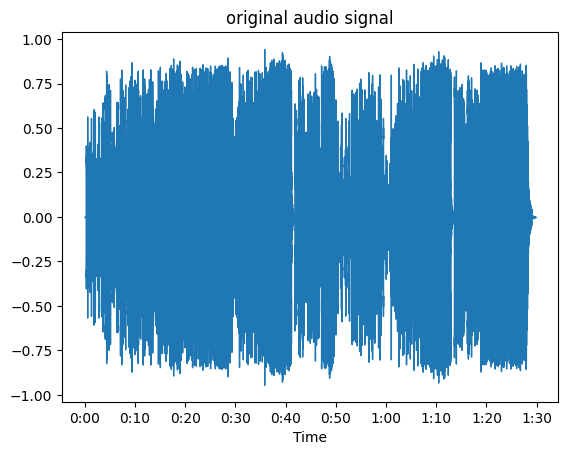

In [15]:
actual_audio,sr = librosa.load(audio_file_path, sr=sampling_rate)
librosa.display.waveshow(actual_audio)
plt.title("original audio signal")

Text(0.5, 1.0, 'voice signal')

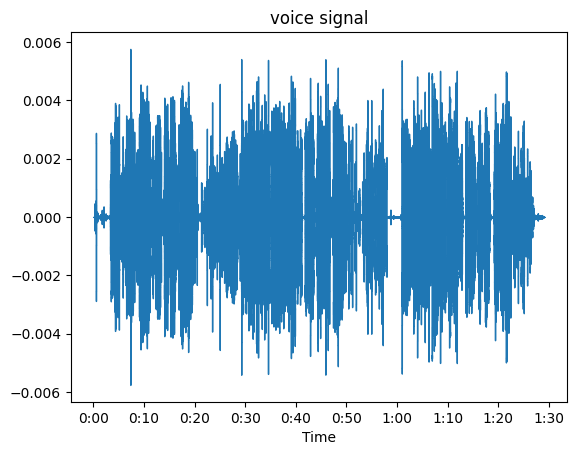

In [33]:
librosa.display.waveshow(isolated)
plt.title("voice signal")

Text(0.5, 1.0, 'voice signal')

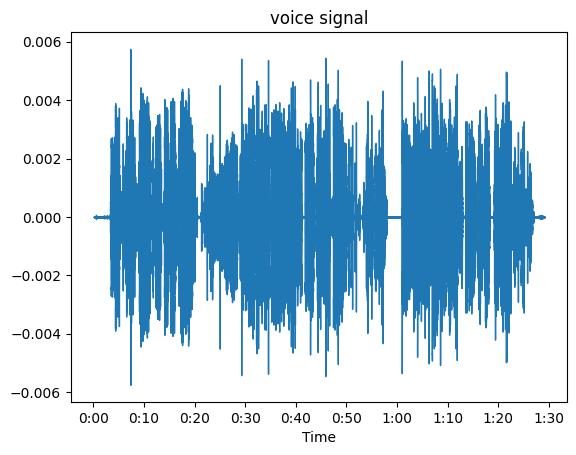

In [36]:
librosa.display.waveshow(re_isolated)
plt.title("voice signal")

In [36]:
# model.save("model.keras")

In [4]:
# model = tf.keras.models.load_model('model.keras')

2024-12-19 22:13:51.870709: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-12-19 22:13:51.870781: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-12-19 22:13:51.870795: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-12-19 22:13:51.870816: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-19 22:13:51.870832: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
